# Modelling

In [1]:
from image_clustering_utils import *

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

## Import Images and Labels

In [2]:
path = "/kaggle/input/vq48-4side-bright-mold-with-labels/VQ48 4side bright mold with labels"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
packages = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.png'):
          # adds only the image files to the list
            packages.append(file.name)

In [3]:
print(packages[:10])

['2664.png', '2539.png', '1231.png', '1017.png', '2437.png', '3217.png', '3207.png', '2015.png', '2300.png', '2673.png']


In [4]:
# import image labels
df_test = pd.read_csv("image_labels.csv")

## VGG16 Baseline Model

In [5]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

553467096/553467096 [==============================] - 3s 0us/step


In [6]:
data = {}
preprocess_input = vgg16.preprocess_input

# Variable to keep track of the loop count
count = 0
# Start time
start_time = time.time()

# loop through each image in the dataset
for item in packages:
    # extract the features and update the dictionary
    feat = extract_features(item,model,preprocess_input)
    data[item] = feat
    count += 1

    # Display progress and elapsed time every 500 iterations
    if count % 500 == 0:
        elapsed_time = time.time() - start_time
        print(f"Processed {count} images in {elapsed_time:.2f} seconds.")

# Final progress update and total elapsed time
elapsed_time = time.time() - start_time
print(f"Finished processing {count} images in {elapsed_time:.2f} seconds.")

Processed 500 images in 47.46 seconds.
Processed 1000 images in 90.29 seconds.
Processed 1500 images in 132.67 seconds.
Processed 2000 images in 174.82 seconds.
Processed 2500 images in 219.01 seconds.
Processed 3000 images in 262.95 seconds.
Processed 3500 images in 308.80 seconds.
Finished processing 3892 images in 343.69 seconds.


In [7]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

In [8]:
# get a list of just the features
feat = np.array(list(data.values()))
feat.shape

(3892, 1, 4096)

In [9]:
# reshape so that there are 3892 samples of 4096 vectors
feat = feat.reshape(-1,4096)
feat.shape

(3892, 4096)

In [10]:
# reduce the amount of dimensions in the feature vector, try 150 as the number of components
pca = PCA(n_components=150, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

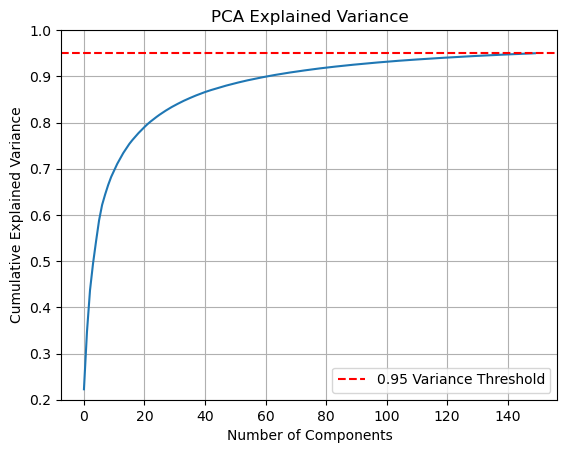

In [11]:
plot_PCA(pca)

When n_components=150, Cumulative Explained Variance met the 0.95 threshold.

In [12]:
# try k value ranges from 2 to 14, output the clustering results
k_weight = {}

for k in range(2,15):
    print(f"k = {k}")
    k_weight[k] = cluster_results(k,x,filenames,df_test)
    print("=======================================")

k = 2
Cluster 0 results: total 451 images
1    0.993348
0    0.006652
Name: Image Result, dtype: float64
Cluster 1 results: total 3441 images
0    0.688463
1    0.311537
Name: Image Result, dtype: float64
Average cluster homogeneity is 0.723792394655704
k = 3
Cluster 0 results: total 1900 images
0    0.669474
1    0.330526
Name: Image Result, dtype: float64
Cluster 1 results: total 445 images
1    0.993258
0    0.006742
Name: Image Result, dtype: float64
Cluster 2 results: total 1547 images
0    0.709114
1    0.290886
Name: Image Result, dtype: float64
Average cluster homogeneity is 0.7222507708119219
k = 4
Cluster 0 results: total 202 images
1    0.960396
0    0.039604
Name: Image Result, dtype: float64
Cluster 1 results: total 1907 images
0    0.670163
1    0.329837
Name: Image Result, dtype: float64
Cluster 2 results: total 1526 images
0    0.711664
1    0.288336
Name: Image Result, dtype: float64
Cluster 3 results: total 257 images
1    1.0
Name: Image Result, dtype: float64
Averag

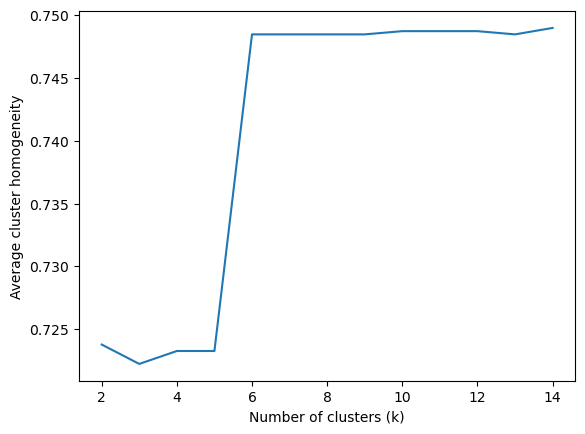

In [13]:
plot_avg_cluster_homo(k_weight)

## VGG16+Flatten Model

In [14]:
# Define VGG16 base model 
base = VGG16(weights = 'imagenet', include_top = False,input_shape=(224, 224, 3))

# Use pretrained weights in base model
for layer in base.layers:
    layer.trainable = False

# Inspect VGG16 model architecture 
base.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [15]:
# Define top output layer 
tf_model = Sequential()
tf_model.add(base)
tf_model.add(Flatten())

# Model summary 
tf_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
Total params: 14,714,688
Trainable params: 0
Non-trainable params: 14,714,688
_________________________________________________________________


In [16]:
model = tf_model
model = Model(inputs = model.inputs, outputs = model.layers[-1].output)

In [17]:
data = {}
preprocess_input = vgg16.preprocess_input

# Variable to keep track of the loop count
count = 0
# Start time
start_time = time.time()

# loop through each image in the dataset
for item in packages:
    # extract the features and update the dictionary
    feat = extract_features(item,model,preprocess_input)
    data[item] = feat
    count += 1

    # Display progress and elapsed time every 500 iterations
    if count % 500 == 0:
        elapsed_time = time.time() - start_time
        print(f"Processed {count} images in {elapsed_time:.2f} seconds.")

# Final progress update and total elapsed time
elapsed_time = time.time() - start_time
print(f"Finished processing {count} images in {elapsed_time:.2f} seconds.")

Processed 500 images in 41.86 seconds.
Processed 1000 images in 85.67 seconds.
Processed 1500 images in 127.13 seconds.
Processed 2000 images in 170.73 seconds.
Processed 2500 images in 213.00 seconds.
Processed 3000 images in 254.36 seconds.
Processed 3500 images in 296.64 seconds.
Finished processing 3892 images in 329.27 seconds.


In [18]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

In [19]:
# get a list of just the features
feat = np.array(list(data.values()))
feat.shape

(3892, 1, 25088)

In [20]:
# reshape so that there are 3892 samples of 25088 vectors
feat = feat.reshape(-1,25088)
feat.shape

(3892, 25088)

In [21]:
# reduce the amount of dimensions in the feature vector, try 650 as the number of components
pca = PCA(n_components=650, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

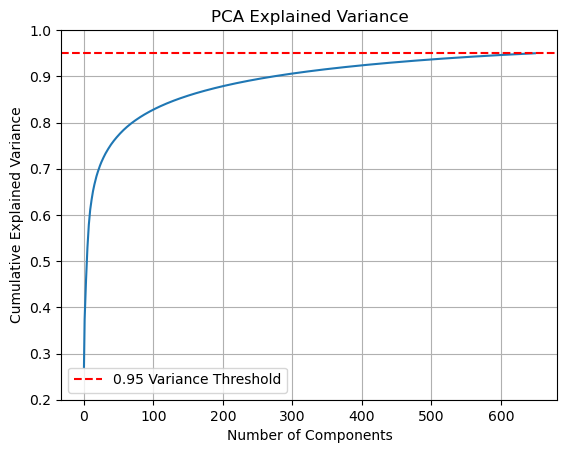

In [22]:
plot_PCA(pca)

When n_components=650, Cumulative Explained Variance met the 0.95 threshold.

In [23]:
k_weight = {}

for k in range(2,15):
    print(f"k = {k}")
    k_weight[k] = cluster_results(k,x,filenames,df_test)
    print("=======================================")

k = 2
Cluster 0 results: total 2170 images
1    0.52212
0    0.47788
Name: Image Result, dtype: float64
Cluster 1 results: total 1722 images
0    0.775261
1    0.224739
Name: Image Result, dtype: float64
Average cluster homogeneity is 0.6341212744090442
k = 3
Cluster 0 results: total 778 images
1    0.965296
0    0.034704
Name: Image Result, dtype: float64
Cluster 1 results: total 1418 images
0    0.712976
1    0.287024
Name: Image Result, dtype: float64
Cluster 2 results: total 1696 images
0    0.786557
1    0.213443
Name: Image Result, dtype: float64
Average cluster homogeneity is 0.7954779033915724
k = 4
Cluster 0 results: total 772 images
1    0.966321
0    0.033679
Name: Image Result, dtype: float64
Cluster 1 results: total 1419 images
0    0.712474
1    0.287526
Name: Image Result, dtype: float64
Cluster 2 results: total 865 images
0    0.747977
1    0.252023
Name: Image Result, dtype: float64
Cluster 3 results: total 836 images
0    0.822967
1    0.177033
Name: Image Result, dty

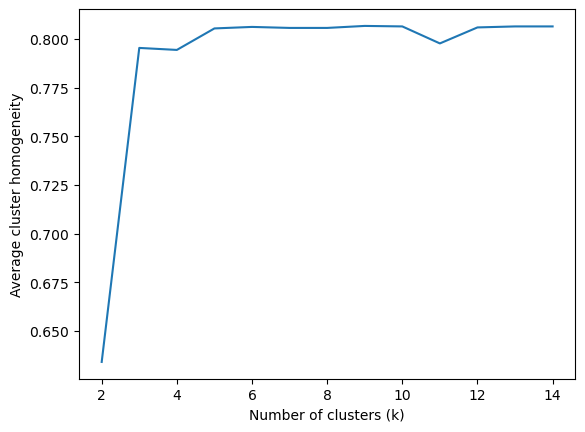

In [24]:
plot_avg_cluster_homo(k_weight)

### View 15 representative images of each cluster

In [25]:
# cluster feature vectors with best k
kmeans = KMeans(n_clusters=6, random_state=22)
kmeans.fit(x)

groups = group_id_images(filenames, kmeans)

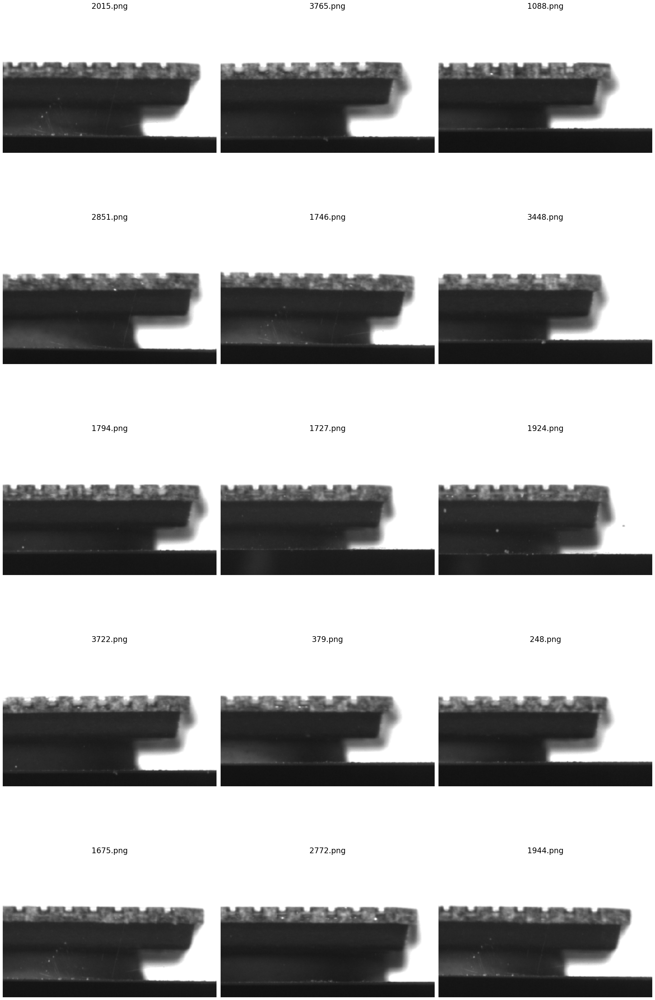

In [26]:
view_cluster(0,groups)

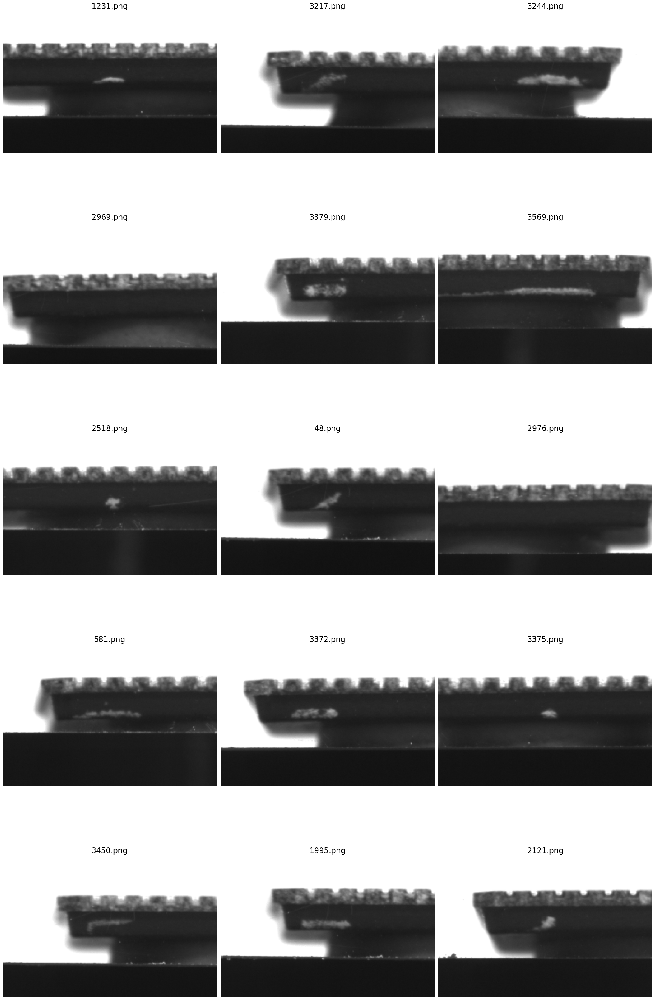

In [27]:
view_cluster(1,groups)

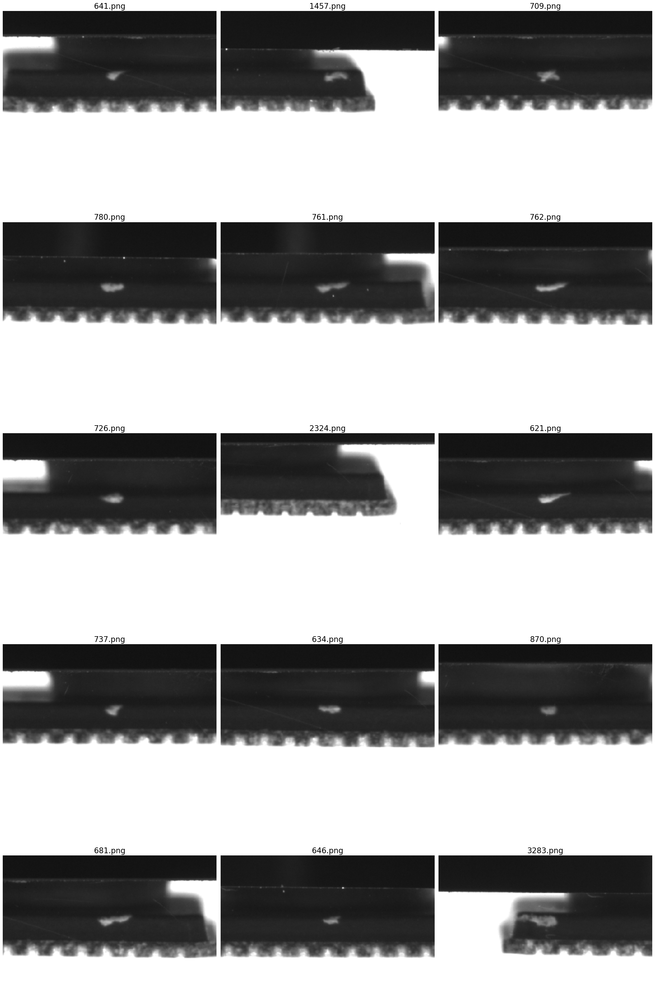

In [28]:
view_cluster(2,groups)

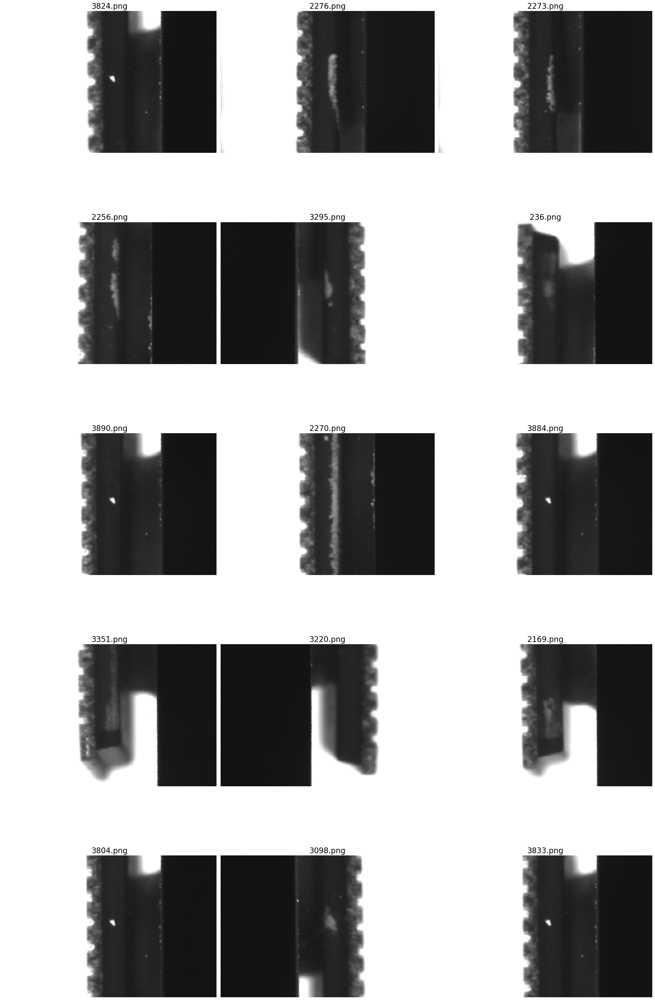

In [29]:
view_cluster(3,groups)

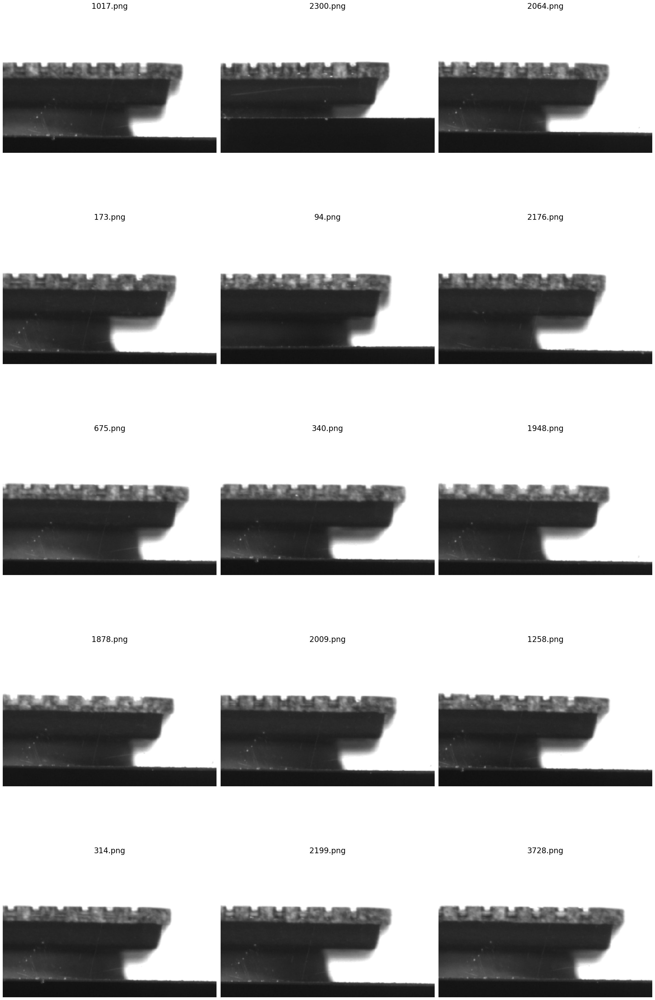

In [30]:
view_cluster(4,groups)

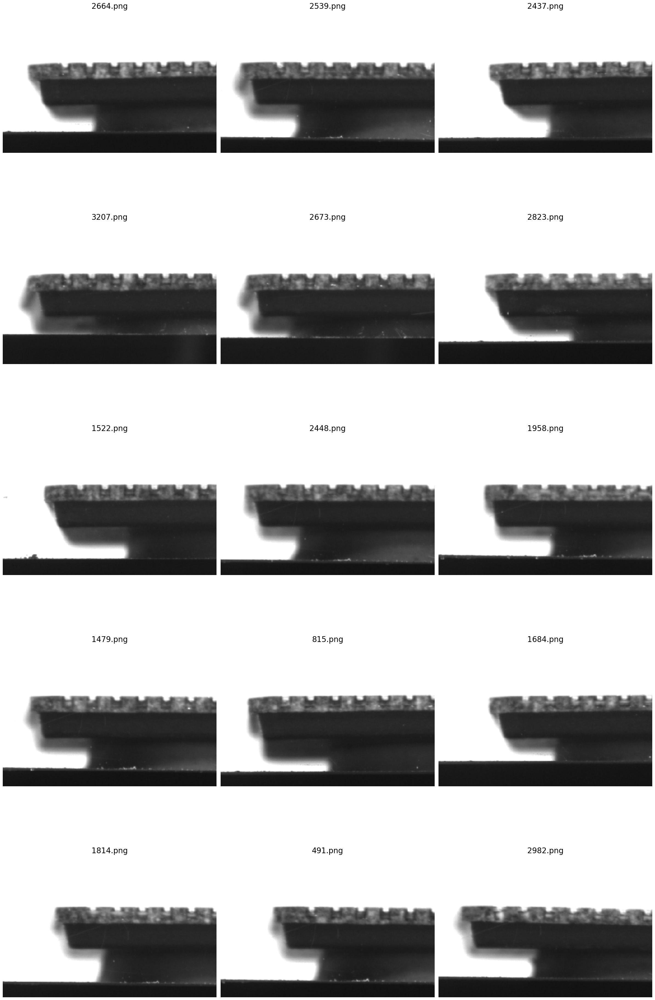

In [31]:
view_cluster(5,groups)

## InceptionV3+Flatten Model

In [32]:
# Define InceptionV3 base model 
base = InceptionV3(weights = 'imagenet', include_top = False, input_shape = (224, 224, 3))

# Use pretrained weights in base model
for layer in base.layers:
    layer.trainable = False

# Inspect InceptionV3 model architecture 
base.summary()

87910968/87910968 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)           

In [33]:
# Define top output layer 
inception_model = Sequential()
inception_model.add(base)
inception_model.add(Flatten())

# Model summary 
inception_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_1 (Flatten)         (None, 51200)             0         
                                                                 
Total params: 21,802,784
Trainable params: 0
Non-trainable params: 21,802,784
_________________________________________________________________


In [34]:
model = inception_model
model = Model(inputs = model.inputs, outputs = model.layers[-1].output)

In [35]:
data = {}
preprocess_input = inception_v3.preprocess_input

# Variable to keep track of the loop count
count = 0
# Start time
start_time = time.time()

# loop through each image in the dataset
for item in packages:
    # extract the features and update the dictionary
    feat = extract_features(item,model,preprocess_input)
    data[item] = feat
    count += 1

    # Display progress and elapsed time every 500 iterations
    if count % 500 == 0:
        elapsed_time = time.time() - start_time
        print(f"Processed {count} images in {elapsed_time:.2f} seconds.")

# Final progress update and total elapsed time
elapsed_time = time.time() - start_time
print(f"Finished processing {count} images in {elapsed_time:.2f} seconds.")

Processed 500 images in 47.93 seconds.
Processed 1000 images in 94.98 seconds.
Processed 1500 images in 140.66 seconds.
Processed 2000 images in 187.25 seconds.
Processed 2500 images in 233.71 seconds.
Processed 3000 images in 280.16 seconds.
Processed 3500 images in 327.89 seconds.
Finished processing 3892 images in 363.76 seconds.


In [36]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

In [37]:
# get a list of just the features
feat = np.array(list(data.values()))
feat.shape

(3892, 1, 51200)

In [38]:
# reshape so that there are 3892 samples of 51200 vectors
feat = feat.reshape(-1,51200)
feat.shape

(3892, 51200)

In [39]:
# reduce the amount of dimensions in the feature vector, try 1200 as the number of components
pca = PCA(n_components=1200, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

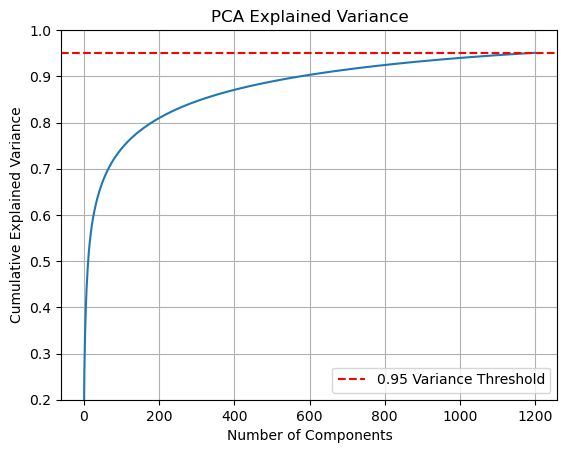

In [40]:
plot_PCA(pca)

When n_components=1200, Cumulative Explained Variance met the 0.95 threshold.

In [41]:
k_weight = {}

for k in range(2,15):
    print(f"k = {k}")
    k_weight[k] = cluster_results(k,x,filenames,df_test)
    print("=======================================")

k = 2
Cluster 0 results: total 793 images
1    0.986129
0    0.013871
Name: Image Result, dtype: float64
Cluster 1 results: total 3099 images
0    0.761859
1    0.238141
Name: Image Result, dtype: float64
Average cluster homogeneity is 0.8075539568345323
k = 3
Cluster 0 results: total 786 images
1    0.983461
0    0.016539
Name: Image Result, dtype: float64
Cluster 1 results: total 1399 images
0    0.721229
1    0.278771
Name: Image Result, dtype: float64
Cluster 2 results: total 1707 images
0    0.790861
1    0.209139
Name: Image Result, dtype: float64
Average cluster homogeneity is 0.8047276464542652
k = 4
Cluster 0 results: total 1381 images
0    0.73063
1    0.26937
Name: Image Result, dtype: float64
Cluster 1 results: total 1696 images
0    0.792453
1    0.207547
Name: Image Result, dtype: float64
Cluster 2 results: total 460 images
1    0.982609
0    0.017391
Name: Image Result, dtype: float64
Cluster 3 results: total 355 images
1    0.969014
0    0.030986
Name: Image Result, dty

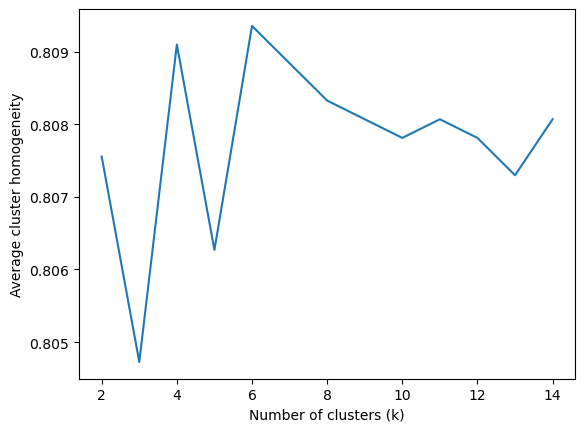

In [42]:
plot_avg_cluster_homo(k_weight)